In [1]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u

from ctapipe.instrument import CameraGeometry
from ctapipe.visualization import CameraDisplay
from ctapipe.utils import get_dataset_path
from ctapipe.io import EventSource
from ctapipe.calib import CameraCalibrator
from ctapipe.image.cleaning import tailcuts_clean
from ctapipe.image.hillas import hillas_parameters
from copy import deepcopy
import os

/Users/thomasvuillaume/opt/anaconda3/envs/pres_cta/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import ctapipe
ctapipe.__version__

'0.12.0'

In [3]:
source = EventSource(input_url=get_dataset_path('gamma_test_large.simtel.gz'))
# source = event_source('/Users/thomasvuillaume/Work/CTA/Data/DL0/Simtel/LST_mono/gamma_20deg_180deg_run100___cta-prod3-demo-2147m-LaPalma-baseline-mono_off0.4.simtel',
#                      max_events=1000)

In [4]:
tot = 0
n = 3
for event in source:
    if 1 in event.r0.tel:
        if event.r0.tel[1].waveform[0].sum() > tot:
            tot = event.r0.tel[1].waveform[0].sum()
            big_event = deepcopy(event)
    if len(event.r0.tel) > n:
        be2 = deepcopy(event)
        n = len(event.r0.tel)

In [5]:
big_event.r0.tel

Map(ctapipe.containers.R0CameraContainer,
    {1: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     2: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     3: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     4: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     5: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     7: ctapi

In [6]:
be2.r0.tel

Map(ctapipe.containers.R0CameraContainer,
    {2: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     3: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     4: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     5: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     6: ctapipe.containers.R0CameraContainer:
                           waveform: numpy array containing ADC samples(n_channels,
                                     n_pixels, n_samples),
     7: ctapi

In [7]:
cal = CameraCalibrator(source.subarray)

In [8]:
cal(big_event)
cal(be2)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [9]:
outdir = 'images_uncalibrated'
os.makedirs(outdir, exist_ok=True)

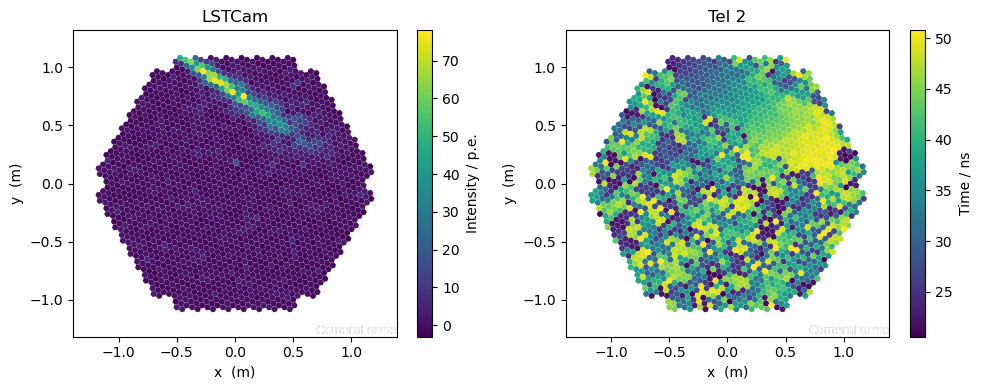

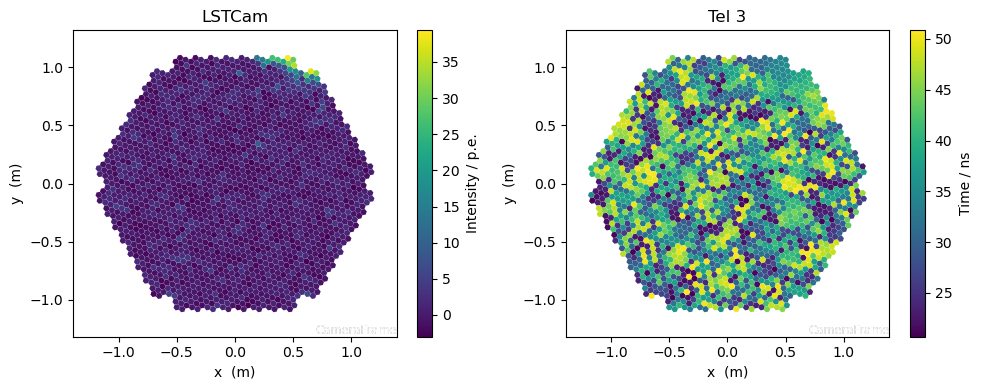

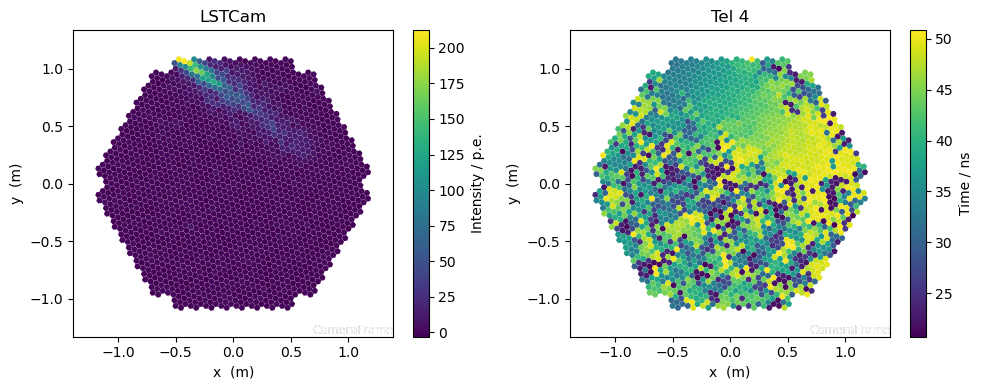

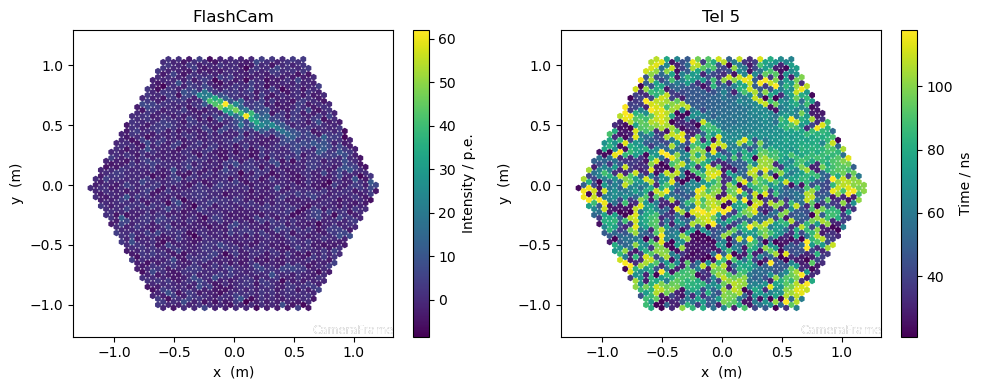

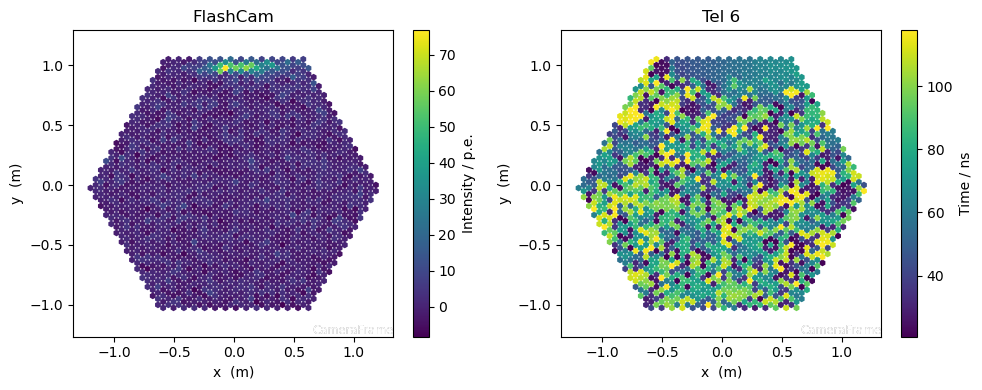

...

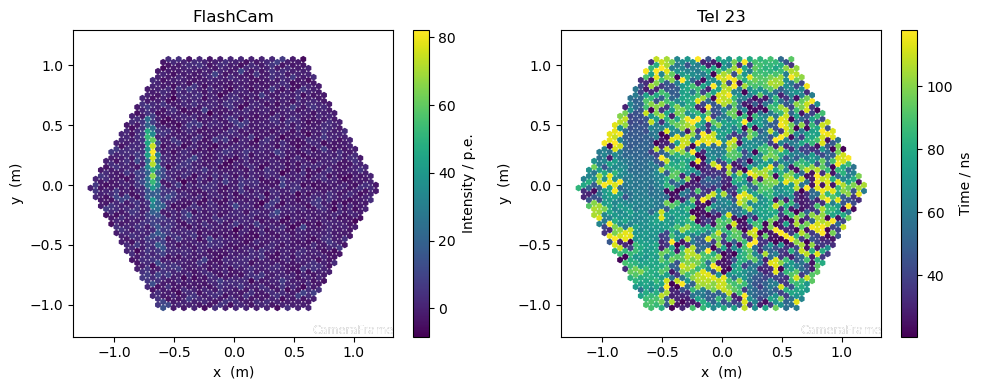

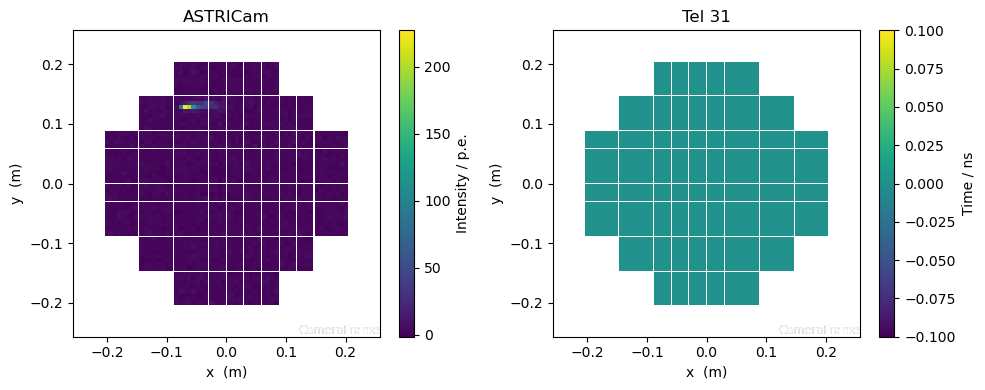

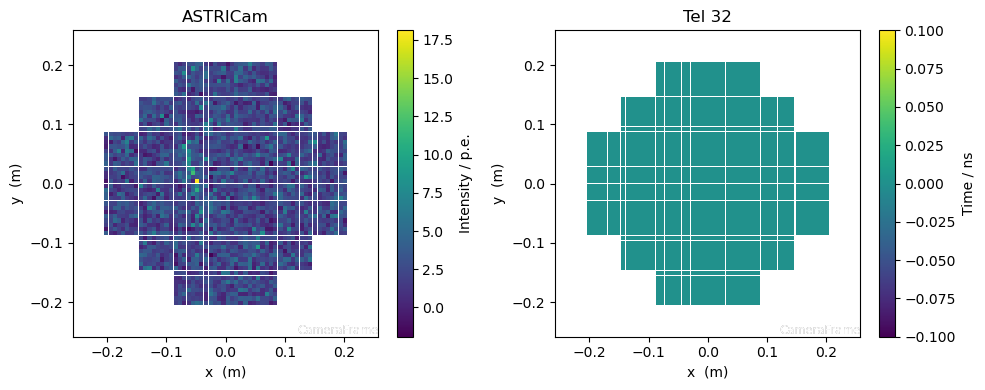

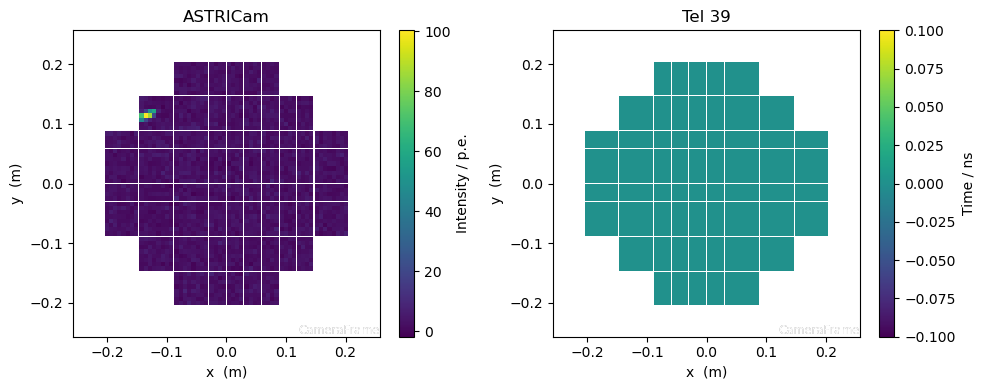

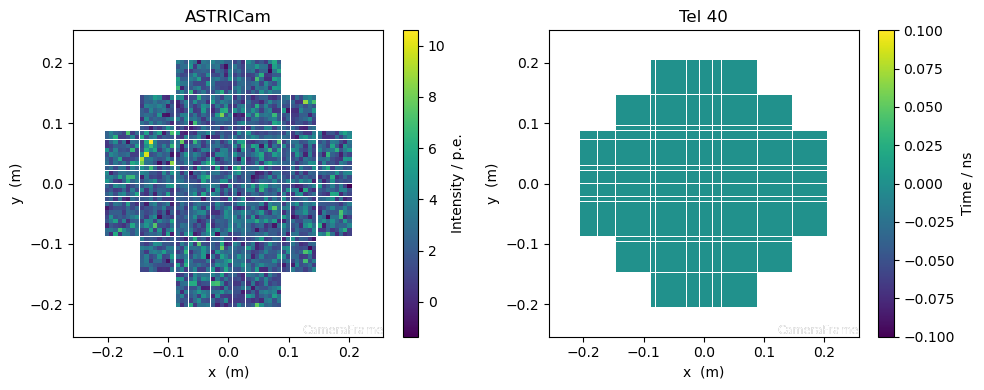

In [10]:
event = be2
for tel_id in list(event.r0.tel)[:]:
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    geom = source.subarray.tels[tel_id].camera.geometry
    image = event.dl1.tel[tel_id].image
    pulse_time = event.dl1.tel[tel_id].peak_time
    display = CameraDisplay(geom, image, ax=axes[0])
    display.add_colorbar()
    display.colorbar.set_label('Intensity / p.e.', rotation=90)
    display.add_frame_name(color='white')
    display = CameraDisplay(geom, pulse_time, ax=axes[1])
    display.add_colorbar()
    display.colorbar.set_label('Time / ns', rotation=90)
    display.add_frame_name(color='white')
    
    axes[1].set_title(f'Tel {tel_id}')
    
    plt.tight_layout()
    
    plt.savefig(os.path.join(outdir, f'{event.index.event_id}-tel{tel_id:02d}.png'), dpi=250)
    plt.show()

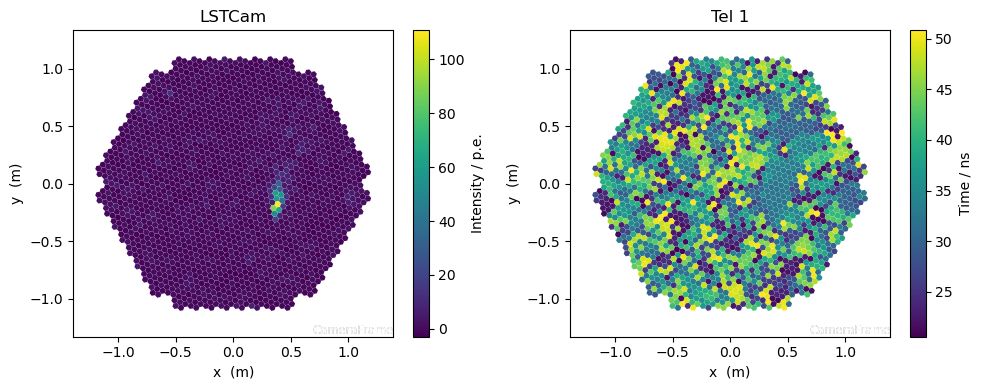

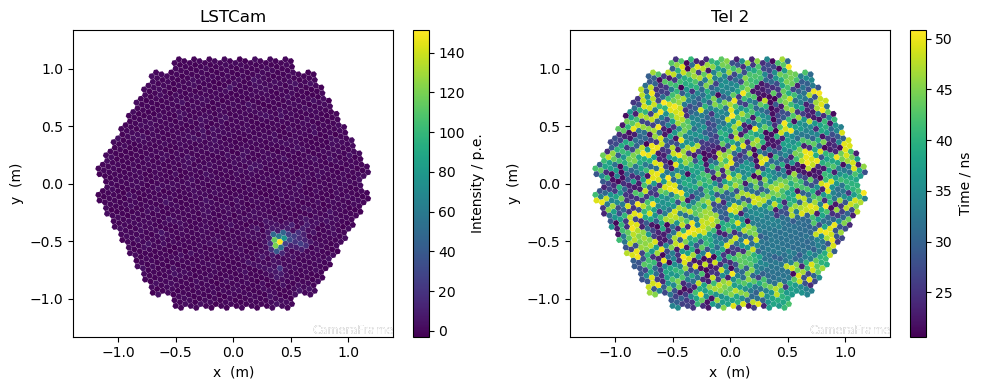

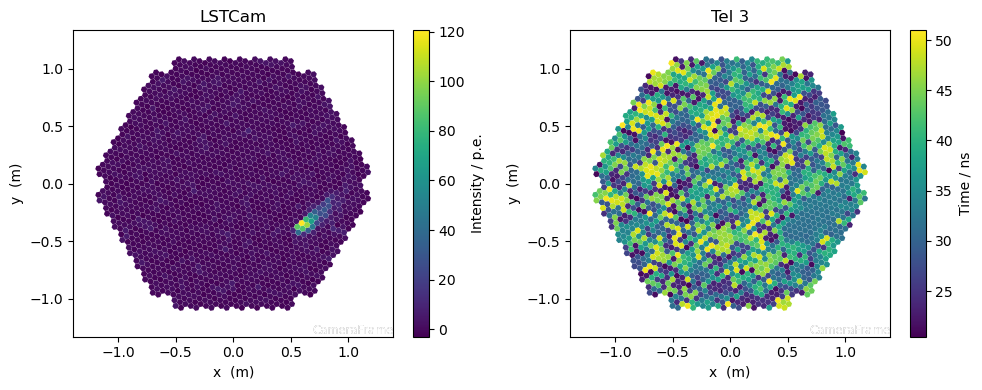

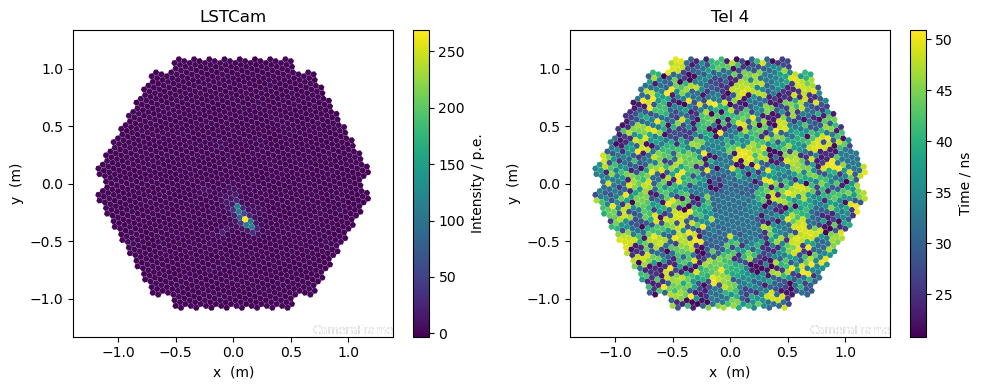

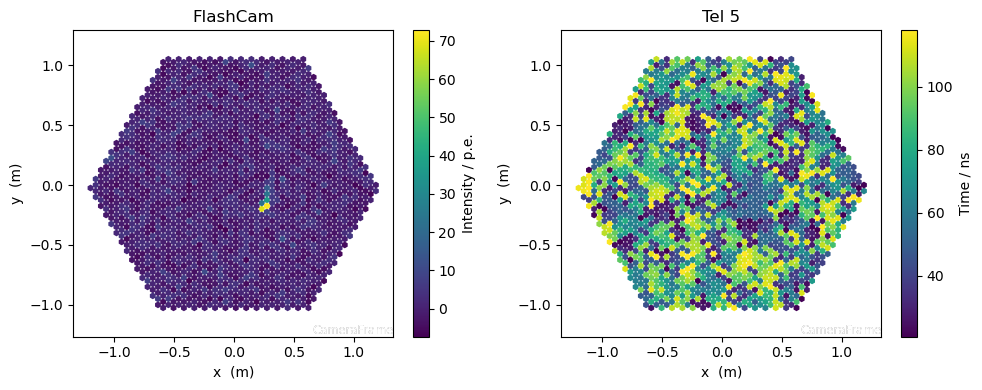

...

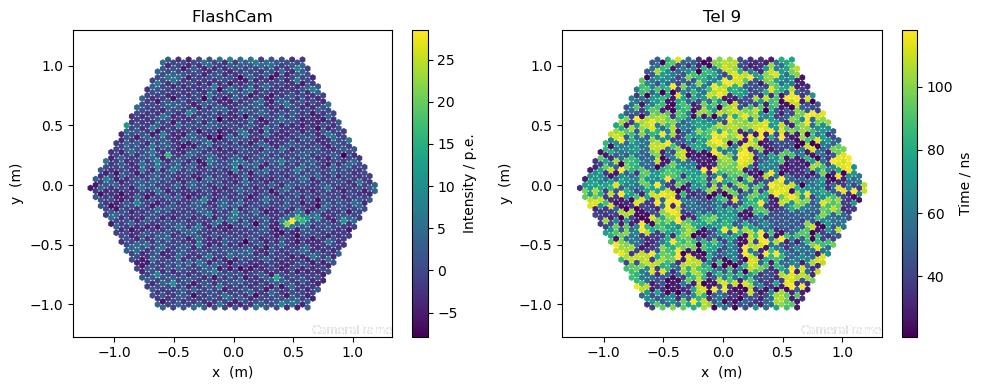

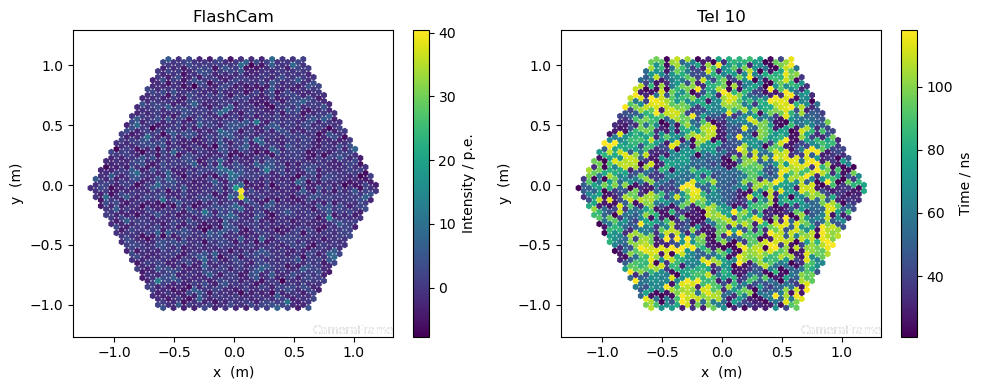

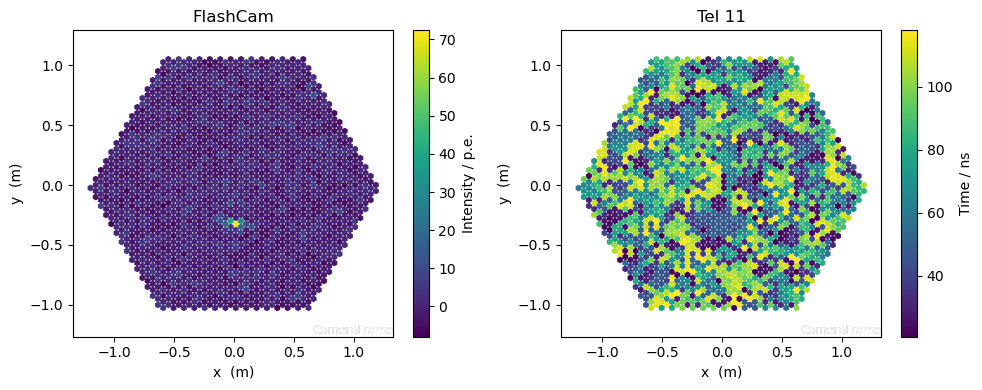

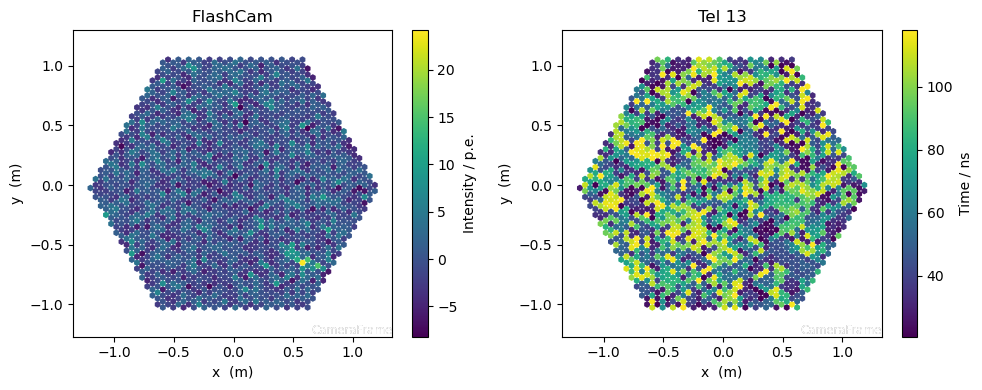

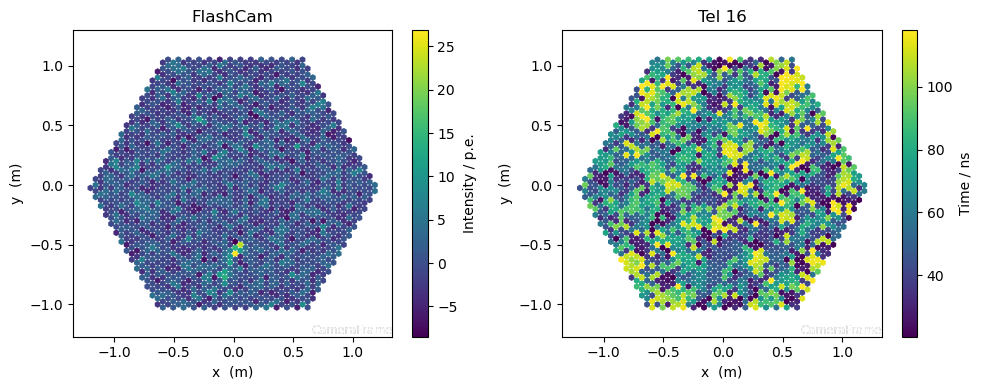

In [11]:
event = big_event
for tel_id in list(event.r0.tel)[:]:
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    geom = source.subarray.tels[tel_id].camera.geometry
    image = event.dl1.tel[tel_id].image
    pulse_time = event.dl1.tel[tel_id].peak_time
    display = CameraDisplay(geom, image, ax=axes[0])
    display.add_colorbar()
    display.colorbar.set_label('Intensity / p.e.', rotation=90)
    display.add_frame_name(color='white')
    display = CameraDisplay(geom, pulse_time, ax=axes[1])
    display.add_colorbar()
    display.colorbar.set_label('Time / ns', rotation=90)
    display.add_frame_name(color='white')
    
    axes[1].set_title(f'Tel {tel_id}')
    
    plt.tight_layout()
    
    plt.savefig(os.path.join(outdir, f'{event.index.event_id}-tel{tel_id:02d}.png'), dpi=250)
    plt.show()

In [12]:
# pick an event and a tel
event = big_event
print(event.r0.tel)
tel_id = 1

Map(<class 'ctapipe.containers.R0CameraContainer'>, {1: ctapipe.containers.R0CameraContainer:
                      waveform: numpy array containing ADC samples(n_channels,
                                n_pixels, n_samples), 2: ctapipe.containers.R0CameraContainer:
                      waveform: numpy array containing ADC samples(n_channels,
                                n_pixels, n_samples), 3: ctapipe.containers.R0CameraContainer:
                      waveform: numpy array containing ADC samples(n_channels,
                                n_pixels, n_samples), 4: ctapipe.containers.R0CameraContainer:
                      waveform: numpy array containing ADC samples(n_channels,
                                n_pixels, n_samples), 5: ctapipe.containers.R0CameraContainer:
                      waveform: numpy array containing ADC samples(n_channels,
                                n_pixels, n_samples), 7: ctapipe.containers.R0CameraContainer:
                      waveform: nump

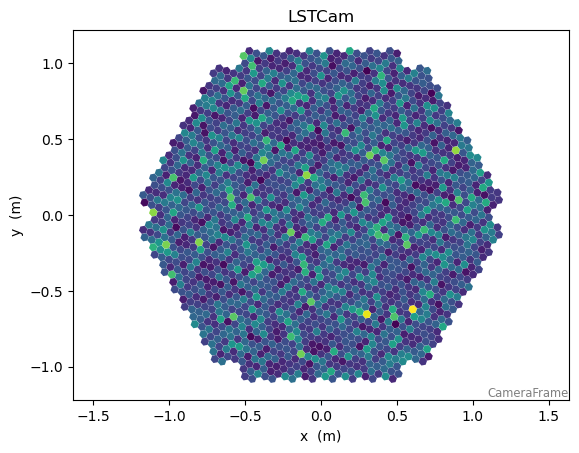

In [13]:
geom = source.subarray.tel[tel_id].camera.geometry
CameraDisplay(geom, event.r0.tel[tel_id].waveform[0][:,0])

In [14]:
output_dir = f'images_gif_tel_{tel_id}'
os.makedirs(output_dir, exist_ok=True)

In [15]:
# define some plotting options

visible_axis = False
color = 'black' # or 'dark'
transparent = True
camera_border_color = 'black' # or None
show_frame = False

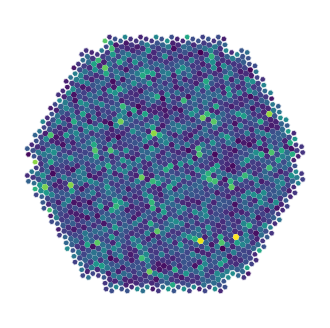

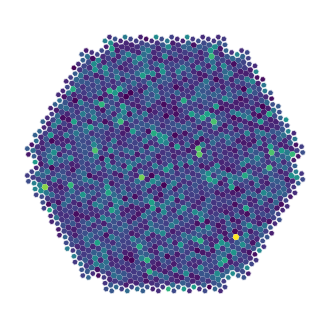

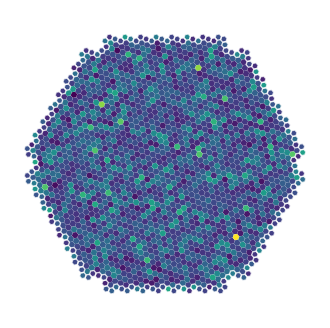

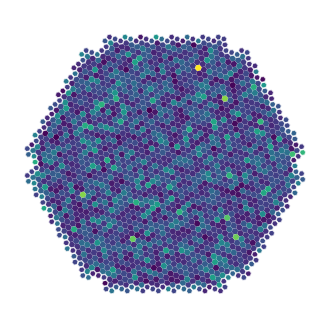

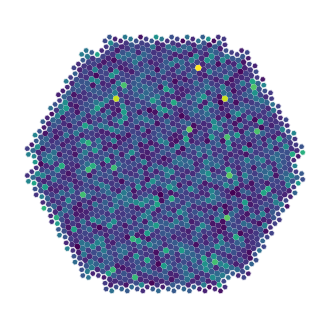

...

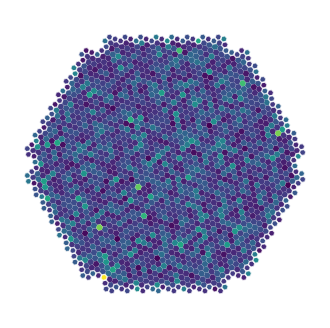

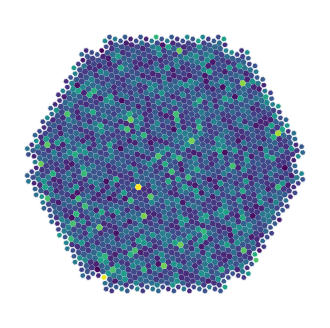

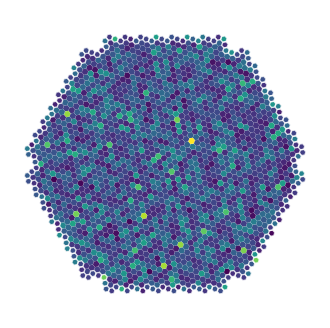

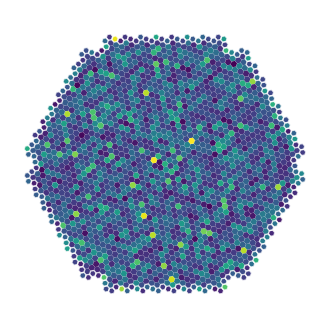

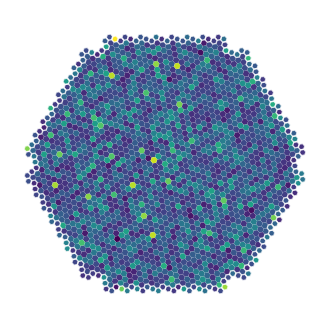

In [16]:
for ii in range(event.r0.tel[tel_id].waveform[0].shape[1]):
    image = event.r0.tel[tel_id].waveform[0][:,ii]
#     print(image.shape)
    fig, ax = plt.subplots(figsize=(4, 4))
    display = CameraDisplay(geom, image, show_frame=show_frame)
    display.add_frame_name(color='white')
    if camera_border_color is not None:
        display.highlight_pixels(geom.get_border_pixel_mask(), color='white')
    fig.axes[0].get_xaxis().set_visible(visible_axis)
    fig.axes[0].get_yaxis().set_visible(visible_axis)
    fig.patch.set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
    ax.set_title('')

    plt.savefig(os.path.join(output_dir, f'image_{ii:02d}.png'), dpi=400, transparent=transparent)
    plt.show()

In [17]:
# produce the gif
# gif_cmd = f'convert -delay 40 -loop 0 {output_dir}/*.png waveform_tel_{tel_id}.gif'
# os.system(gif_cmd)

In [18]:
ls -lsh *.gif

12664 -rw-r--r--@ 1 thomasvuillaume  staff   6,2M 10 avr 18:18 waveform_tel_1.gif


# Pipeline

## Calibration

In [19]:
cal = CameraCalibrator(source.subarray)
cal(big_event)

In [20]:
tel_id = 1

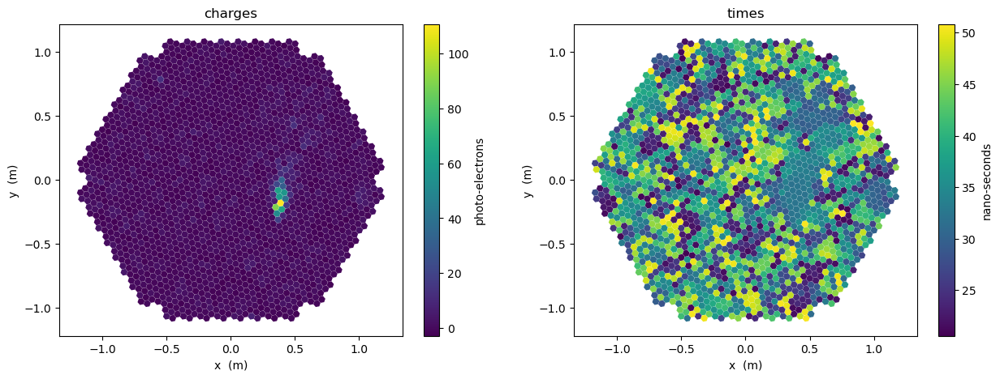

In [21]:
visible_axis = True

fig, axes = plt.subplots(1, 2, figsize=(15,5))
image = event.dl1.tel[tel_id].image
d0 = CameraDisplay(geom, image, ax=axes[0], show_frame=show_frame)
axes[0].set_title('charges')
d0.add_colorbar(ax=axes[0])
d0.colorbar.set_label('photo-electrons')

pulse_time = event.dl1.tel[tel_id].peak_time

d1 = CameraDisplay(geom, pulse_time, ax=axes[1], show_frame=show_frame)
axes[1].set_title('times')
d1.add_colorbar(ax=axes[1])
d1.colorbar.set_label('nano-seconds')

for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)


plt.savefig(f'calibrated_tel_{tel_id}.png', dpi=400, transparent=True)

In [22]:
visible_axisble_axis = False

In [23]:
camera_border_color = None

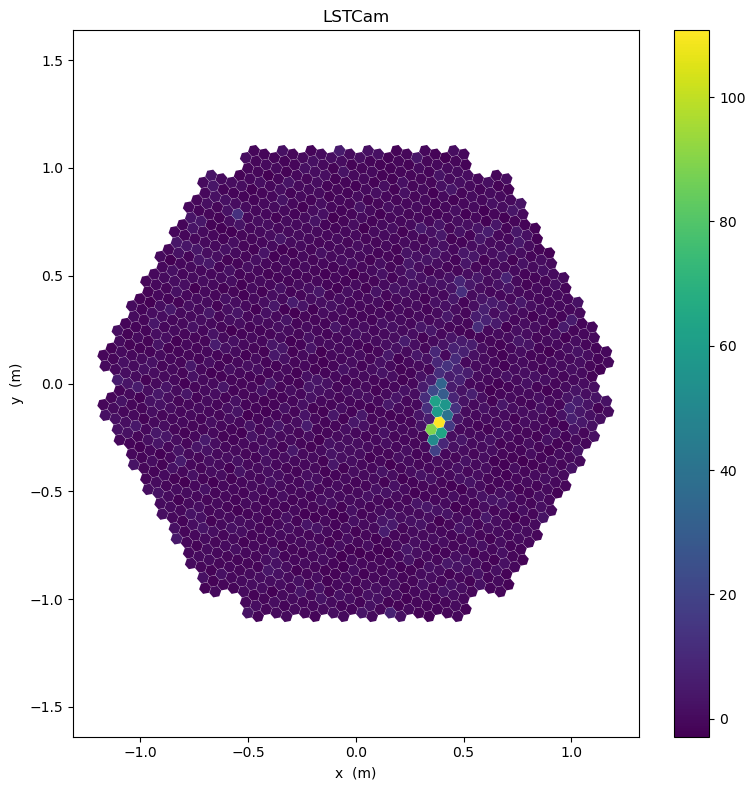

In [24]:
fig = plt.figure(figsize=(8,8))
display = CameraDisplay(geom, image, show_frame=show_frame)

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    display.add_colorbar()
    
fig.tight_layout()

axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)


plt.savefig(f'calibrated_charges_tel_{tel_id}.png', dpi=400, transparent=True)

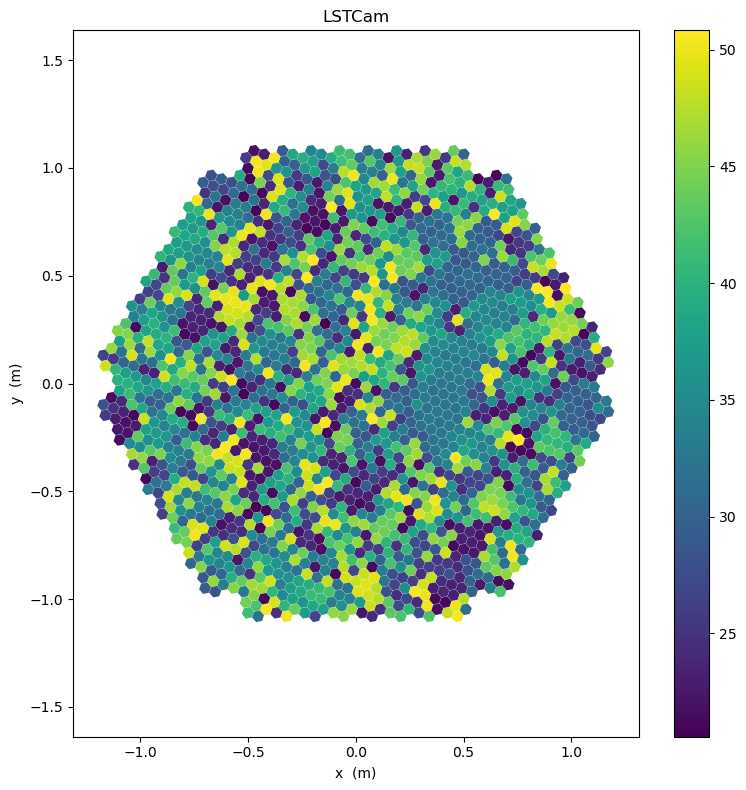

In [25]:
fig = plt.figure(figsize=(8,8))
display = CameraDisplay(geom, pulse_time, show_frame=show_frame)

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    display.add_colorbar()
    
fig.tight_layout()

axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)


plt.savefig(f'calibrated_times_tel_{tel_id}.png', dpi=400, transparent=True)

In [26]:
signal_pixels = tailcuts_clean(geom, image, picture_thresh=8, boundary_thresh=4, min_number_picture_neighbors=2)

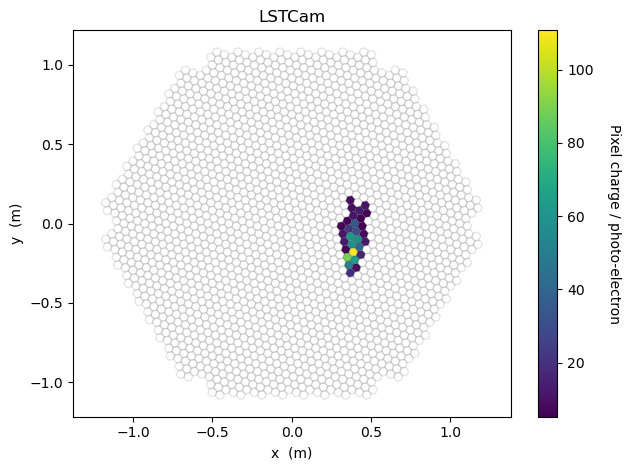

In [27]:
cleaned_image = deepcopy(image)
cleaned_image[~signal_pixels] = 0
fig = plt.figure()

transparent_pixels = True
if transparent_pixels:
    cleaned_image[~signal_pixels] = np.nan


display = CameraDisplay(geom, cleaned_image, show_frame=show_frame)

if transparent_pixels:
    display.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.1)
    # display.set_limits_minmax(0, 100)


if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

display.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.1)
    

if visible_axis:
    display.add_colorbar()
    
fig.tight_layout()

axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)


display.colorbar.ax.set_ylabel('Pixel charge / photo-electron', rotation=270, labelpad=20)


plt.savefig(f'cleaned_tel_{tel_id}.png', dpi=400, transparent=True)

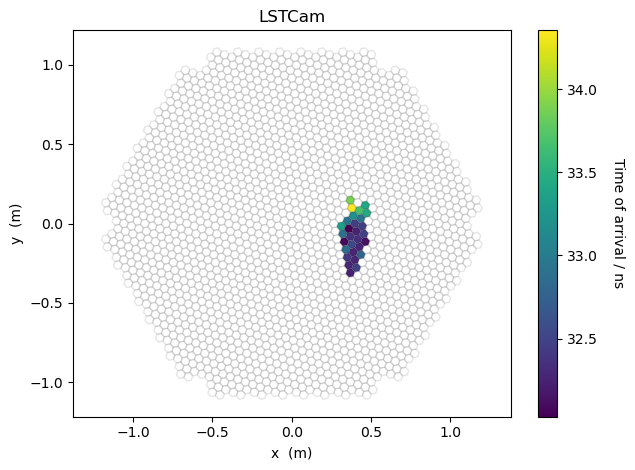

In [28]:
cleaned_time = deepcopy(pulse_time)
cleaned_time[~signal_pixels] = 0
fig = plt.figure()

camera_border_color = None
transparent_pixels = True

if transparent_pixels:
    cleaned_time[~signal_pixels] = np.nan

display = CameraDisplay(geom, cleaned_time, show_frame=show_frame)

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)
    
if transparent_pixels:
    display.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.1)
    # display.set_limits_minmax(0, 100)

if visible_axis:
    display.add_colorbar()
    
fig.tight_layout()

axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)

display.colorbar.ax.set_ylabel('Time of arrival / ns', rotation=270, labelpad=20)

plt.savefig(f'cleaned_time_tel_{tel_id}.png', dpi=300, transparent=True)

In [29]:
cleaned_image[~signal_pixels] = 0
hillas = hillas_parameters(geom, cleaned_image)

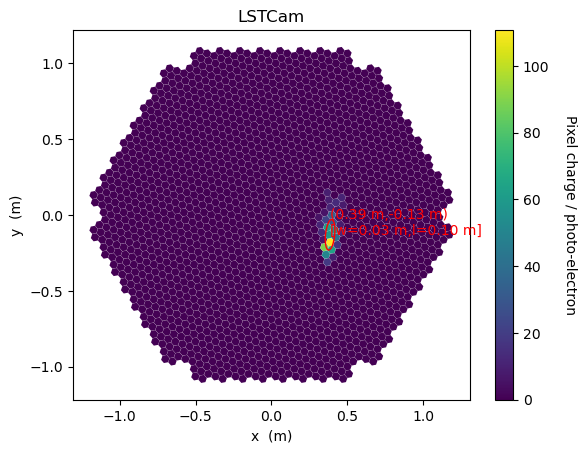

In [30]:
fig = plt.figure()
display = CameraDisplay(geom, cleaned_image, show_frame=show_frame)
display.overlay_moments(hillas, color='red')

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    display.add_colorbar()

axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)

display.colorbar.ax.set_ylabel('Pixel charge / photo-electron', rotation=270, labelpad=20)

fig.savefig(f'hillas_tel_{tel_id}.png', dpi=300, transparent=True)

In [31]:
plt.style.use(['seaborn-paper', 'seaborn-colorblind'])

/var/folders/59/4fqs_6jj1c91hc_fqclch3fc0000gp/T/ipykernel_17411/325564449.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use(['seaborn-paper', 'seaborn-colorblind'])
/var/folders/59/4fqs_6jj1c91hc_fqclch3fc0000gp/T/ipykernel_17411/325564449.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use(['seaborn-paper', 'seaborn-colorblind'])


In [32]:
# from lstchain.reco.utils import sky_to_camera

In [33]:
from ctapipe.coordinates import EngineeringCameraFrame
geom = CameraGeometry.from_name('LSTCam').transform_to(EngineeringCameraFrame())

In [34]:
# source_in_cam = sky_to_camera(event.simulation.shower.alt, event.simulation.shower.az, 
#                               source.subarray.tels[tel_id].optics.equivalent_focal_length,
#                               event.pointing.tel[tel_id].altitude,
#                               event.pointing.tel[tel_id].azimuth
#                              ).transform_to(EngineeringCameraFrame())

In [35]:
# geom.cam_rotation = 0 *u.rad

In [39]:
# geom.pix_rotation = 0 * u.rad

In [41]:
hillas.phi

<Angle -1.24440232 rad>

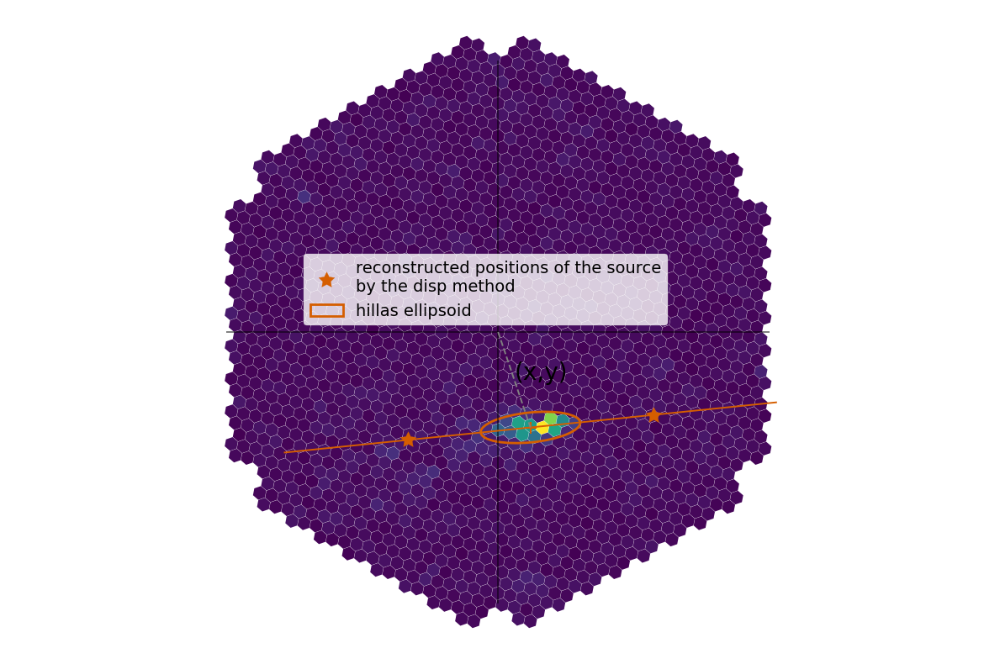

In [48]:
fig = plt.figure(figsize=(12,8))

transparent_pixels = True
display_image = deepcopy(cleaned_image)

if transparent_pixels:
    display_image[~signal_pixels] = np.nan


display = CameraDisplay(geom, display_image, show_frame=show_frame)

if transparent_pixels:
    display.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.2)


# display.overlay_moments(hillas, color='red')

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    display.add_colorbar()

    
visible_axis=False
axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)

if visible_axis:
    display.colorbar.ax.set_ylabel('Pixel charge / photo-electron', rotation=270, labelpad=20)


axis_color = 'black'
display.axes.hlines(0, -1.1, 1.1, color=axis_color, alpha=0.5)
display.axes.vlines(0, -1.1, 1.1, color=axis_color, alpha=0.5)

### Hillas direction
scale = 1
display.axes.plot([hillas.x.to_value(u.m) - scale*np.cos(hillas.psi), hillas.x.to_value(u.m) + scale*np.cos(hillas.psi)],
                  [hillas.y.to_value(u.m) - scale*np.sin(hillas.psi), hillas.y.to_value(u.m) + scale*np.sin(hillas.psi)],
                  color='C2'
                 )
display.axes.scatter(hillas.x.to_value(u.m), hillas.y.to_value(u.m),
                     s=100,
                     marker='+',
                     color='C2')

### Source 
source_marker = dict(marker=(5, 1), s=200)
# display.axes.scatter(source_in_cam.x, source_in_cam.y, 
#                      **source_marker,
#                      color='C1',
#                      label='true position of the source'
#                     )

# display.axes.plot([hillas.x.to_value(u.m), source_in_cam.x.to_value(u.m)],
#                   [hillas.y.to_value(u.m), source_in_cam.y.to_value(u.m)],
#                   color='C1',
#                   ls='--',
#                  )

disp = 0.5
display.axes.scatter(hillas.x.to_value(u.m) - disp*np.cos(hillas.psi),
                     hillas.y.to_value(u.m) - disp*np.sin(hillas.psi),
                     **source_marker,
                     color='C2',
                     label='reconstructed positions of the source\nby the disp method'
                    )
display.axes.scatter(hillas.x.to_value(u.m) + disp*np.cos(hillas.psi),
                     hillas.y.to_value(u.m) + disp*np.sin(hillas.psi),
                     **source_marker,
                     color='C2')

display.axes.plot([0,  hillas.x.to_value(u.m)], [0, hillas.y.to_value(u.m)], color='gray', ls='--')

hillas = hillas_parameters(geom, cleaned_image)
hillas.width *= 2
hillas.length *= 2
display.overlay_moments(hillas, color='C2', lw=2, with_label=False, label='hillas ellipsoid')
display.axes.text(hillas.x.value/2, hillas.y.value/2,
                  '(x,y)', fontsize=20)
# display.axes.plot([-1,  1], [0, 1],
#                   color='black', 
#                   ls='--',
                  
#                  )

display.axes.legend(loc=(0.3, 0.51), fontsize=14)

fig.tight_layout()
fig.savefig(f'source_disp_tel_{tel_id}.png', dpi=300, transparent=True)

In [76]:
display

In [ ]:
fig = plt.figure(figsize=(12,8))

lam = 7
noisy_image = deepcopy(image) + 3*np.random.poisson(lam=lam, size=image.size)
# noisy_image = np.ones_like(image)
signal_pixels = tailcuts_clean(geom, noisy_image, picture_thresh=8+lam*5, boundary_thresh=4+lam*5, min_number_picture_neighbors=2)
cleaned_image = deepcopy(noisy_image)
cleaned_image[~signal_pixels] = 0
hillas = hillas_parameters(geom, cleaned_image)



transparent_pixels = False
# display_image = deepcopy(cleaned_image)
display_image = deepcopy(noisy_image)
if transparent_pixels:
    display_image[~signal_pixels] = np.nan


display = CameraDisplay(geom, display_image, show_frame=show_frame)

if transparent_pixels:
    display.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.2)


# display.overlay_moments(hillas, color='red')

if camera_border_color is not None:
    display.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    display.add_colorbar()

    
visible_axis=True
axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)

if visible_axis:
    display.colorbar.ax.set_ylabel('Pixel charge / photo-electron', rotation=270, labelpad=20)


axis_color = 'black'
display.axes.hlines(0, -1.1, 1.1, color=axis_color, alpha=0.5)
display.axes.vlines(0, -1.1, 1.1, color=axis_color, alpha=0.5)


### Source 
source_marker = dict(marker=(5, 1), s=200)
# display.axes.scatter(source_in_cam.x, source_in_cam.y, 
#                      **source_marker,
#                      color='C1',
#                      label='true position of the source'
#                     )

# display.axes.plot([hillas.x.to_value(u.m), source_in_cam.x.to_value(u.m)],
#                   [hillas.y.to_value(u.m), source_in_cam.y.to_value(u.m)],
#                   color='C1',
#                   ls='--',
#                  )

disp = 0.5
# display.axes.scatter(hillas.x.to_value(u.m) - disp*np.cos(hillas.psi),
#                      hillas.y.to_value(u.m) - disp*np.sin(hillas.psi),
#                      **source_marker,
#                      color='C2',
#                      label='reconstructed positions of the source\nby the disp method'
#                     )
# display.axes.scatter(hillas.x.to_value(u.m) + disp*np.cos(hillas.psi),
#                      hillas.y.to_value(u.m) + disp*np.sin(hillas.psi),
#                      **source_marker,
#                      color='C2')

display.axes.plot([0,  hillas.x.to_value(u.m)], [0, hillas.y.to_value(u.m)], color='gray', ls='--')

hillas = hillas_parameters(geom, cleaned_image)
scale = 1.5
hillas.width *= scale
hillas.length *= scale
display.overlay_moments(hillas, color='C2', lw=2, with_label=False, label='hillas ellipsoid')
display.axes.text(0.75*hillas.x.value, 0.75*hillas.y.value,
                  '(x,y)', 
                  fontsize=20,
                  color='C2'
                 )
### Hillas direction
length = hillas.length.value
display.axes.plot([hillas.x.to_value(u.m) - length*np.cos(hillas.psi),
                   hillas.x.to_value(u.m) + length*np.cos(hillas.psi)],
                  [hillas.y.to_value(u.m) - length*np.sin(hillas.psi),
                   hillas.y.to_value(u.m) + length*np.sin(hillas.psi)],
                  color='C2'
                 )


length = hillas.width.value
display.axes.plot([hillas.x.to_value(u.m) - length*np.cos(hillas.psi+np.pi/2*u.rad),
                   hillas.x.to_value(u.m) + length*np.cos(hillas.psi+np.pi/2*u.rad)],
                  [hillas.y.to_value(u.m) - length*np.sin(hillas.psi+np.pi/2*u.rad),
                   hillas.y.to_value(u.m) + length*np.sin(hillas.psi+np.pi/2*u.rad)],
                  color='C2'
                 )

display.axes.scatter(hillas.x.to_value(u.m), hillas.y.to_value(u.m),
                     s=100,
                     marker='+',
                     color='C2')

display.axes.legend(loc=(0.6, 0.9), fontsize=14)

fig.tight_layout()
fig.savefig(f'tel_{tel_id}_hillas_lambda_{lam}.png', dpi=300, transparent=True)

In [ ]:
visible_axis = True
camera_border_color = None
transparent_pixels = True

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15,5))
image = event.dl1.tel[tel_id].image
pulse_time = np.minimum(40, np.maximum(0, event.dl1.tel[tel_id].peak_time))
cleaned_time = deepcopy(pulse_time)


if transparent_pixels:
    cleaned_image[~signal_pixels] = np.nan
    cleaned_time[~signal_pixels] = np.nan
else:
    cleaned_image[~signal_pixels] = 0
    cleaned_time[~signal_pixels] = 0


d0 = CameraDisplay(geom, cleaned_image, ax=axes[0], show_frame=show_frame)
# d0.overlay_moments(hillas, color='red')
axes[0].set_title('charges')


if camera_border_color is not None:
    d0.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    d0.add_colorbar(ax=axes[0])
    d0.colorbar.set_label('Pixel charges / photo-electrons', rotation=270, labelpad=20)


d1 = CameraDisplay(geom, cleaned_time, ax=axes[1], show_frame=show_frame)
axes[1].set_title("times")

if camera_border_color is not None:
    d1.highlight_pixels(geom.get_border_pixel_mask(), color=camera_border_color)

if visible_axis:
    d1.add_colorbar(ax=axes[1])
    d1.colorbar.set_label('Arrival times / ns', rotation=270, labelpad=20)

if transparent_pixels:
    d0.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.1)
    d1.highlight_pixels(np.ones(geom.n_pixels, dtype=bool), color='black', alpha=0.1)

    
axes = fig.get_axes()
for ax in axes:
    ax.get_xaxis().set_visible(visible_axis)
    ax.get_yaxis().set_visible(visible_axis)
    if not visible_axis:
        ax.axis('off')
        ax.set_title('')
fig.patch.set_visible(visible_axis)


plt.savefig(f'cleaned_tel_{tel_id}.png', dpi=300, transparent=True)